<a href="https://colab.research.google.com/github/bongseok-choi/CSES/blob/master/cnn%2Blstm.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
cd /content/drive/MyDrive/Colab

/content/drive/MyDrive/Colab


In [ ]:
!git clone https://github.com/wkzs111/phm-ieee-2012-data-challenge-dataset.git

Cloning into 'phm-ieee-2012-data-challenge-dataset'...
remote: Enumerating objects: 28426, done.
remote: Total 28426 (delta 0), reused 0 (delta 0), pack-reused 28426
Receiving objects: 100% (28426/28426), 483.08 MiB | 9.68 MiB/s, done.
Resolving deltas: 100% (15/15), done.
Updating files: 100% (42744/42744), done.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import os
import numpy as np
import pandas as pd
import pickle as pkl

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
def read_data_as_df(base_dir):
  '''
  saves each file in the base_dir as a df and concatenate all dfs into one
  '''
  if base_dir[-1]!='/':
    base_dir += '/'

  dfs=[]
  for f in sorted(os.listdir(base_dir)):
    print(f)
    df=pd.read_csv(base_dir+f, header=None, names=['hour', 'minute', 'second', 'microsecond', 'horiz accel', 'vert accel'])
    dfs.append(df)
  return pd.concat(dfs)

def process(base_dir, out_file):
  '''
  dumps combined dataframes into pkz (pickle) files for faster retreival
  '''
  df=read_data_as_df(base_dir)
  assert df.shape[0]==len(os.listdir(base_dir))*DATA_POINTS_PER_FILE
  with open(out_file, 'wb') as pfile:
    pkl.dump(df, pfile)
  print('{0} saved'.format(out_file))

DATA_POINTS_PER_FILE=2560
'''
Storing all directory(base_dir) files into single combined files (pickle(.pkz) files). That means all files of Bearing1_7 directory will be stored and saved
as bearing1_7.pkz file (this file contains all the data files of Bearing1_7 directory). Same for remaining 10 files (10 test data files).
'''
main_dir = '/content/drive/MyDrive/Colab/phm-ieee-2012-data-challenge-dataset/Learning_set/'
base_dir, out_file= main_dir+'Bearing1_1/', main_dir+'bearing1_1.pkz'
process(base_dir, out_file)
base_dir, out_file= main_dir+'Bearing1_2/', main_dir+'bearing1_2.pkz'
process(base_dir, out_file)
base_dir, out_file= main_dir+'Bearing2_1/', main_dir+'bearing2_1.pkz'
process(base_dir, out_file)
base_dir, out_file= main_dir+'Bearing2_2/', main_dir+'bearing2_2.pkz'
process(base_dir, out_file)
base_dir, out_file= main_dir+'Bearing3_1/', main_dir+'bearing3_1.pkz'
process(base_dir, out_file)
base_dir, out_file= main_dir+'Bearing3_2/', main_dir+'bearing3_2.pkz'
process(base_dir, out_file)

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
acc_02541.csv
acc_02542.csv
acc_02543.csv
acc_02544.csv
acc_02545.csv
acc_02546.csv
acc_02547.csv
acc_02548.csv
acc_02549.csv
acc_02550.csv
acc_02551.csv
acc_02552.csv
acc_02553.csv
acc_02554.csv
acc_02555.csv
acc_02556.csv
acc_02557.csv
acc_02558.csv
acc_02559.csv
acc_02560.csv
acc_02561.csv
acc_02562.csv
acc_02563.csv
acc_02564.csv
acc_02565.csv
acc_02566.csv
acc_02567.csv
acc_02568.csv
acc_02569.csv
acc_02570.csv
acc_02571.csv
acc_02572.csv
acc_02573.csv
acc_02574.csv
acc_02575.csv
acc_02576.csv
acc_02577.csv
acc_02578.csv
acc_02579.csv
acc_02580.csv
acc_02581.csv
acc_02582.csv
acc_02583.csv
acc_02584.csv
acc_02585.csv
acc_02586.csv
acc_02587.csv
acc_02588.csv
acc_02589.csv
acc_02590.csv
acc_02591.csv
acc_02592.csv
acc_02593.csv
acc_02594.csv
acc_02595.csv
acc_02596.csv
acc_02597.csv
acc_02598.csv
acc_02599.csv
acc_02600.csv
acc_02601.csv
acc_02602.csv
acc_02603.csv
acc_02604.csv
acc_02605.csv
acc_02606.csv
acc_02607.csv
acc_02608.csv
acc_02609.cs

In [ ]:
import os
import numpy as np
import pywt
import pandas as pd
import pickle as pkl
from matplotlib import pyplot as plt

In [ ]:
DATA_POINTS_PER_FILE = 2560
TIME_PER_REC = 0.1
SAMPLING_FREQ = 25600 # 25.6 KHz
SAMPLING_PERIOD = 1.0/SAMPLING_FREQ

WIN_SIZE = 20

WAVELET_TYPE = 'morl'

VAL_SPLIT = 0.1

np.random.seed(1234)

In [ ]:
def load_df(pkz_file):
    with open(pkz_file, 'rb') as f:
        df=pkl.load(f)
    return df

In [ ]:
def df_row_ind_to_data_range(ind):
    return (DATA_POINTS_PER_FILE*ind, DATA_POINTS_PER_FILE*(ind+1))

def df_row_ind_to_data_range(ind):
    return (DATA_POINTS_PER_FILE*ind, DATA_POINTS_PER_FILE*(ind+1))

In [ ]:
def extract_feature_image(ind, feature_name='horiz accel'):
    data_range = df_row_ind_to_data_range(ind)
    data = df[feature_name].values[data_range[0]:data_range[1]]
    # use window to process(= prepare, develop) 1D signal
    data = np.array([np.mean(data[i:i+WIN_SIZE]) for i in range(0, DATA_POINTS_PER_FILE, WIN_SIZE)])
    # perform CWT on 1D data(= 1D array)
    coef, _ = pywt.cwt(data, np.linspace(1,128,128), WAVELET_TYPE)
    # transform to power and apply logarithm?!
    coef = np.log2(coef**2+0.001)
    # normalize coef
    coef = (coef - coef.min())/(coef.max() - coef.min())
    return coef

In [ ]:
main_dir = '/content/drive/MyDrive/Colab/phm-ieee-2012-data-challenge-dataset/Learning_set/'

In [ ]:
pkz_file = main_dir + 'bearing1_1.pkz'
df = load_df(pkz_file)
df.head()

,hour,minute,second,microsecond,horiz accel,vert accel
0,9,39,39,65664.0,0.552,-0.146
1,9,39,39,65703.0,0.501,-0.480
2,9,39,39,65742.0,0.138,0.435
3,9,39,39,65781.0,-0.423,0.240
4,9,39,39,65820.0,-0.802,0.020


In [ ]:
no_of_rows = df.shape[0]
no_of_files = int(no_of_rows / DATA_POINTS_PER_FILE)
print(no_of_rows, no_of_files)

7175680 2803


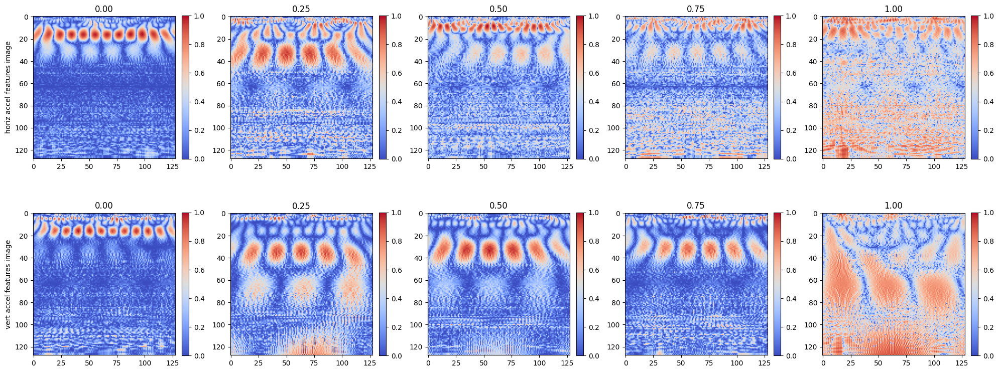

In [ ]:
'''
plotting (= sketching, charting, blueprint, painting) diagrams

here, diagrams => horiz accel feature images and vert accel feature images

both horiz accel and vert accel are vibration signals
'''
no_of_samples=5
fig, ax = plt.subplots(2, no_of_samples, figsize=[20,8])
ax[0,0].set_ylabel('horiz accel features image')
ax[1,0].set_ylabel('vert accel features image')
'''
dividing the feature images into 5 samples
'''
for i, p in enumerate(np.linspace(0,1,no_of_samples)):
    ind = int((no_of_files-1)*p)


  #extracting and plotting horizontal acceleration feature images (horiz accel feature images) for 5 samples (0.00, 0.25, 0.50, 0.75, 1.00).
  #horiz accel => horizontal acceleration vibration signal

    coef = extract_feature_image(ind, feature_name='horiz accel')
    ax[0,i].set_title('{0:.2f}'.format(p))
    im = ax[0,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[0,i], fraction=0.046, pad=0.04)


  #extracting and plotting vertical acceleration feature images (vert accel feature images) for 5 samples (0.00, 0.25, 0.50, 0.75, 1.00).
  #vert accel => vertical acceleration vibration signal

    coef = extract_feature_image(ind, feature_name='vert accel')
    ax[1,i].set_title('{0:.2f}'.format(p))
    im = ax[1,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[1,i], fraction=0.046, pad=0.04)

'''
The tight_layout() function in pyplot module of matplotlib library is used to automatically adjust subplot parameters to give specified padding.
padding = adding space (adding required white space)
'''
plt.tight_layout()
'''
The show() function in pyplot module of matplotlib library is used to display all figures.
'''
plt.show()

In [ ]:
data = {'x': [], 'y': []}
for i in range(0, no_of_files):
    coef_h = extract_feature_image(i, feature_name='horiz accel')
    coef_v = extract_feature_image(i, feature_name='vert accel')
    x_ = np.array([coef_h, coef_v])
    y_ = i/(no_of_files-1)
    data['x'].append(x_)
    data['y'].append(y_)
data['x']=np.array(data['x'])
data['y']=np.array(data['y'])

assert data['x'].shape==(no_of_files, 2, 128, 128)
print(no_of_files, data['x'].shape, data['y'].shape)

2803 (2803, 2, 128, 128) (2803,)


In [ ]:
no_of_val = int(VAL_SPLIT*no_of_files)
perm = np.random.permutation(no_of_files)
val_data = {'x': data['x'][perm[0:no_of_val]], 'y': data['y'][perm[0:no_of_val]]}
train_data = {'x': data['x'][perm[no_of_val: ]], 'y': data['y'][perm[no_of_val: ]]}

print(no_of_val, val_data['x'].shape, val_data['y'].shape)
print(no_of_files-no_of_val, train_data['x'].shape, train_data['y'].shape)

280 (280, 2, 128, 128) (280,)
2523 (2523, 2, 128, 128) (2523,)


In [ ]:
out_file = main_dir + 'bearing1_1_val_data.pkz'
with open(out_file, 'wb') as f:
    pkl.dump(val_data, f)

'''
saving train_data of bearing1_1 as pickle(.pkz) file.

opens the out_file in binary format for writing. and out_file will be renamed as f.

pkl.dump() creates file object named "f" and dumps(=stores) the data of train_data into "f" and saves "f" as bearing1_1_train_data.pkz in selected path
(google drive)
'''
out_file = main_dir + 'bearing1_1_train_data.pkz'
with open(out_file, 'wb') as f:
    pkl.dump(train_data, f)

In [ ]:
pkz_file = main_dir + 'bearing1_2.pkz'
df = load_df(pkz_file)
df.head()

,hour,minute,second,microsecond,horiz accel,vert accel
0,8,47,5,196910.0,0.050,-0.253
1,8,47,5,196950.0,0.165,-0.140
2,8,47,5,196990.0,0.125,0.542
3,8,47,5,197030.0,0.157,-0.261
4,8,47,5,197070.0,0.421,0.081


In [ ]:
no_of_rows = df.shape[0]
no_of_files = int(no_of_rows / DATA_POINTS_PER_FILE)
print(no_of_rows, no_of_files)

2229760 871


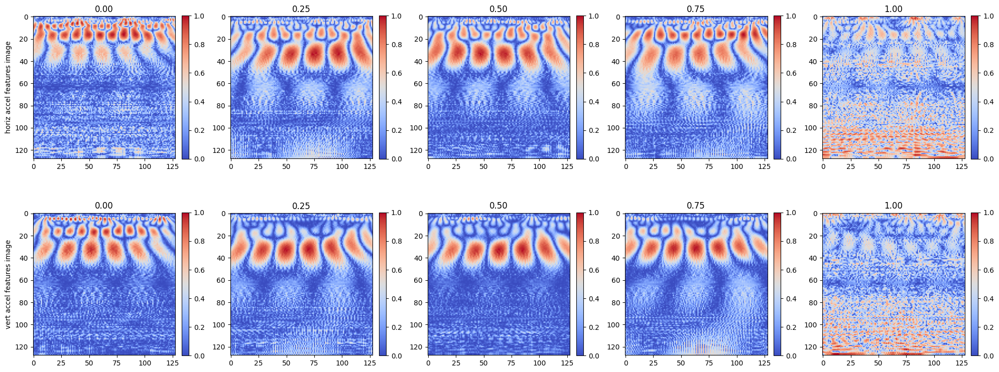

In [ ]:
no_of_samples=5
fig, ax = plt.subplots(2, no_of_samples, figsize=[20,8])
ax[0,0].set_ylabel('horiz accel features image')
ax[1,0].set_ylabel('vert accel features image')

for i, p in enumerate(np.linspace(0,1,no_of_samples)):
    ind = int((no_of_files-1)*p)

    coef = extract_feature_image(ind, feature_name='horiz accel')
    ax[0,i].set_title('{0:.2f}'.format(p))
    im = ax[0,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[0,i], fraction=0.046, pad=0.04)

    coef = extract_feature_image(ind, feature_name='vert accel')
    ax[1,i].set_title('{0:.2f}'.format(p))
    im = ax[1,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[1,i], fraction=0.046, pad=0.04)

plt.tight_layout()

plt.show()

In [ ]:
data = {'x': [], 'y': []}
for i in range(0, no_of_files):
    coef_h = extract_feature_image(i, feature_name='horiz accel')
    coef_v = extract_feature_image(i, feature_name='vert accel')
    x_ = np.array([coef_h, coef_v])
    y_ = i/(no_of_files-1)
    data['x'].append(x_)
    data['y'].append(y_)
data['x']=np.array(data['x'])
data['y']=np.array(data['y'])

assert data['x'].shape==(no_of_files, 2, 128, 128)
print(no_of_files, data['x'].shape, data['y'].shape)

871 (871, 2, 128, 128) (871,)


In [ ]:
no_of_val = int(VAL_SPLIT*no_of_files)
perm = np.random.permutation(no_of_files)
val_data = {'x': data['x'][perm[0:no_of_val]], 'y': data['y'][perm[0:no_of_val]]}
train_data = {'x': data['x'][perm[no_of_val: ]], 'y': data['y'][perm[no_of_val: ]]}

print(no_of_val, val_data['x'].shape, val_data['y'].shape)
print(no_of_files-no_of_val, train_data['x'].shape, train_data['y'].shape)

87 (87, 2, 128, 128) (87,)
784 (784, 2, 128, 128) (784,)


In [ ]:
out_file = main_dir + 'bearing1_2_val_data.pkz'
with open(out_file, 'wb') as f:
    pkl.dump(val_data, f)


out_file = main_dir + 'bearing1_2_train_data.pkz'
with open(out_file, 'wb') as f:
    pkl.dump(train_data, f)

In [ ]:
pkz_file = main_dir + 'bearing2_1.pkz'
df = load_df(pkz_file)
df.head()

,hour,minute,second,microsecond,horiz accel,vert accel
0,8,14,15,884410.0,-0.391,0.011
1,8,14,15,884450.0,0.292,0.133
2,8,14,15,884490.0,0.596,0.024
3,8,14,15,884530.0,0.230,0.272
4,8,14,15,884570.0,-0.225,0.272


In [ ]:
no_of_rows = df.shape[0]
no_of_files = int(no_of_rows / DATA_POINTS_PER_FILE)
print(no_of_rows, no_of_files)

2332160 911


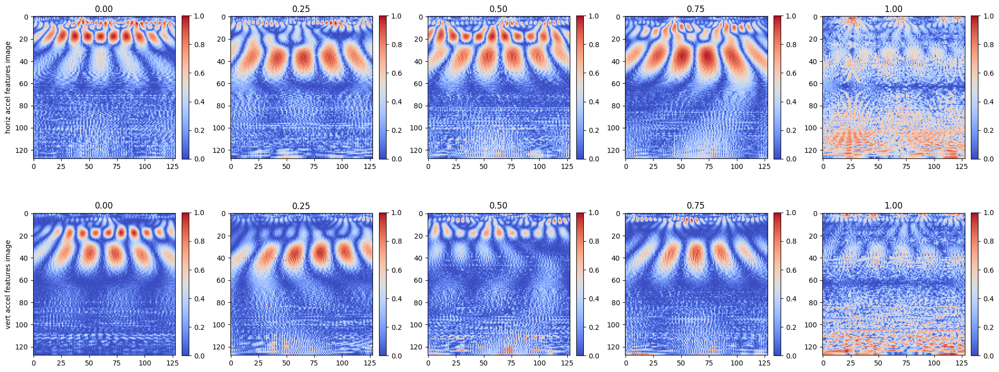

In [ ]:
no_of_samples=5
fig, ax = plt.subplots(2, no_of_samples, figsize=[20,8])
ax[0,0].set_ylabel('horiz accel features image')
ax[1,0].set_ylabel('vert accel features image')

for i, p in enumerate(np.linspace(0,1,no_of_samples)):
    ind = int((no_of_files-1)*p)

    coef = extract_feature_image(ind, feature_name='horiz accel')
    ax[0,i].set_title('{0:.2f}'.format(p))
    im = ax[0,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[0,i], fraction=0.046, pad=0.04)

    coef = extract_feature_image(ind, feature_name='vert accel')
    ax[1,i].set_title('{0:.2f}'.format(p))
    im = ax[1,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[1,i], fraction=0.046, pad=0.04)

plt.tight_layout()

plt.show()

In [ ]:
data = {'x': [], 'y': []}
for i in range(0, no_of_files):
    coef_h = extract_feature_image(i, feature_name='horiz accel')
    coef_v = extract_feature_image(i, feature_name='vert accel')
    x_ = np.array([coef_h, coef_v])
    y_ = i/(no_of_files-1)
    data['x'].append(x_)
    data['y'].append(y_)
data['x']=np.array(data['x'])
data['y']=np.array(data['y'])

assert data['x'].shape==(no_of_files, 2, 128, 128)
print(no_of_files, data['x'].shape, data['y'].shape)

911 (911, 2, 128, 128) (911,)


In [ ]:
no_of_val = int(VAL_SPLIT*no_of_files)
perm = np.random.permutation(no_of_files)
val_data = {'x': data['x'][perm[0:no_of_val]], 'y': data['y'][perm[0:no_of_val]]}
train_data = {'x': data['x'][perm[no_of_val: ]], 'y': data['y'][perm[no_of_val: ]]}

print(no_of_val, val_data['x'].shape, val_data['y'].shape)
print(no_of_files-no_of_val, train_data['x'].shape, train_data['y'].shape)

91 (91, 2, 128, 128) (91,)
820 (820, 2, 128, 128) (820,)


In [ ]:
out_file = main_dir + 'bearing2_1_val_data.pkz'
with open(out_file, 'wb') as f:
    pkl.dump(val_data, f)


out_file = main_dir + 'bearing2_1_train_data.pkz'
with open(out_file, 'wb') as f:
    pkl.dump(train_data, f)

In [ ]:
pkz_file = main_dir + 'bearing2_2.pkz'
df = load_df(pkz_file)
df.head()

,hour,minute,second,microsecond,horiz accel,vert accel
0,7,40,33,540660.0,0.038,0.290
1,7,40,33,540700.0,0.125,-0.104
2,7,40,33,540740.0,0.035,-0.314
3,7,40,33,540780.0,-0.092,0.200
4,7,40,33,540820.0,0.033,0.211


In [ ]:
no_of_rows = df.shape[0]
no_of_files = int(no_of_rows / DATA_POINTS_PER_FILE)
print(no_of_rows, no_of_files)

2040320 797


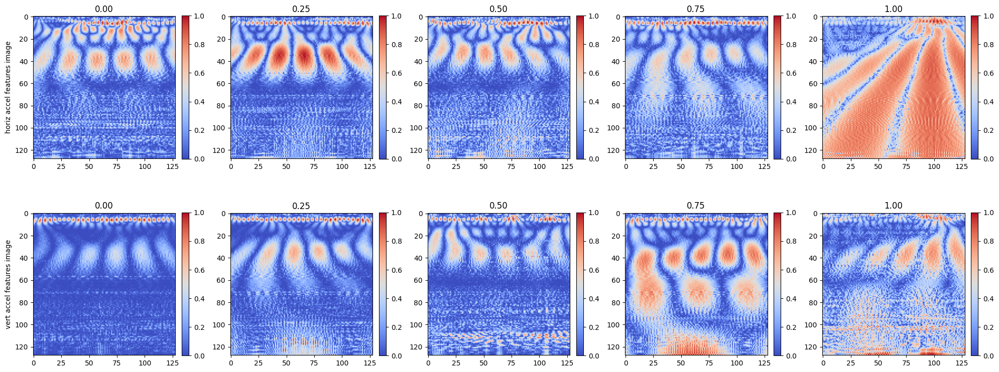

In [ ]:
no_of_samples=5
fig, ax = plt.subplots(2, no_of_samples, figsize=[20,8])
ax[0,0].set_ylabel('horiz accel features image')
ax[1,0].set_ylabel('vert accel features image')

for i, p in enumerate(np.linspace(0,1,no_of_samples)):
    ind = int((no_of_files-1)*p)

    coef = extract_feature_image(ind, feature_name='horiz accel')
    ax[0,i].set_title('{0:.2f}'.format(p))
    im = ax[0,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[0,i], fraction=0.046, pad=0.04)

    coef = extract_feature_image(ind, feature_name='vert accel')
    ax[1,i].set_title('{0:.2f}'.format(p))
    im = ax[1,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[1,i], fraction=0.046, pad=0.04)

plt.tight_layout()

plt.show()

In [ ]:
data = {'x': [], 'y': []}
for i in range(0, no_of_files):
    coef_h = extract_feature_image(i, feature_name='horiz accel')
    coef_v = extract_feature_image(i, feature_name='vert accel')
    x_ = np.array([coef_h, coef_v])
    y_ = i/(no_of_files-1)
    data['x'].append(x_)
    data['y'].append(y_)
data['x']=np.array(data['x'])
data['y']=np.array(data['y'])

assert data['x'].shape==(no_of_files, 2, 128, 128)
print(no_of_files, data['x'].shape, data['y'].shape)

797 (797, 2, 128, 128) (797,)


In [ ]:
no_of_val = int(VAL_SPLIT*no_of_files)
perm = np.random.permutation(no_of_files)
val_data = {'x': data['x'][perm[0:no_of_val]], 'y': data['y'][perm[0:no_of_val]]}
train_data = {'x': data['x'][perm[no_of_val: ]], 'y': data['y'][perm[no_of_val: ]]}

print(no_of_val, val_data['x'].shape, val_data['y'].shape)
print(no_of_files-no_of_val, train_data['x'].shape, train_data['y'].shape)

79 (79, 2, 128, 128) (79,)
718 (718, 2, 128, 128) (718,)


In [ ]:
out_file = main_dir + 'bearing2_2_val_data.pkz'
with open(out_file, 'wb') as f:
    pkl.dump(val_data, f)


out_file = main_dir + 'bearing2_2_train_data.pkz'
with open(out_file, 'wb') as f:
    pkl.dump(train_data, f)

In [ ]:
pkz_file = main_dir + 'bearing3_1.pkz'
df = load_df(pkz_file)
df.head()

,hour,minute,second,microsecond,horiz accel,vert accel
0,9,10,39,118790.0,0.338,-0.263
1,9,10,39,118830.0,0.278,0.285
2,9,10,39,118870.0,0.143,0.590
3,9,10,39,118910.0,0.090,-0.193
4,9,10,39,118940.0,0.035,-0.109


In [ ]:
no_of_rows = df.shape[0]
no_of_files = int(no_of_rows / DATA_POINTS_PER_FILE)
print(no_of_rows, no_of_files)

1318400 515


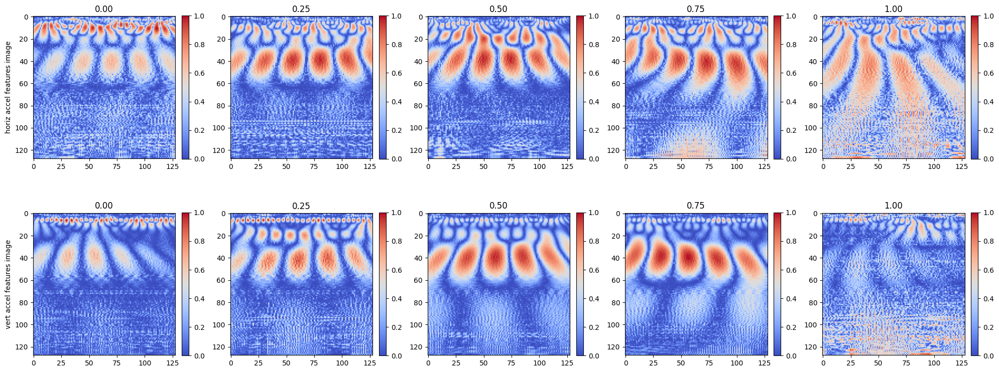

In [ ]:
no_of_samples=5
fig, ax = plt.subplots(2, no_of_samples, figsize=[20,8])
ax[0,0].set_ylabel('horiz accel features image')
ax[1,0].set_ylabel('vert accel features image')

for i, p in enumerate(np.linspace(0,1,no_of_samples)):
    ind = int((no_of_files-1)*p)

    coef = extract_feature_image(ind, feature_name='horiz accel')
    ax[0,i].set_title('{0:.2f}'.format(p))
    im = ax[0,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[0,i], fraction=0.046, pad=0.04)

    coef = extract_feature_image(ind, feature_name='vert accel')
    ax[1,i].set_title('{0:.2f}'.format(p))
    im = ax[1,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[1,i], fraction=0.046, pad=0.04)

plt.tight_layout()

plt.show()

In [ ]:
data = {'x': [], 'y': []}
for i in range(0, no_of_files):
    coef_h = extract_feature_image(i, feature_name='horiz accel')
    coef_v = extract_feature_image(i, feature_name='vert accel')
    x_ = np.array([coef_h, coef_v])
    y_ = i/(no_of_files-1)
    data['x'].append(x_)
    data['y'].append(y_)
data['x']=np.array(data['x'])
data['y']=np.array(data['y'])

assert data['x'].shape==(no_of_files, 2, 128, 128)
print(no_of_files, data['x'].shape, data['y'].shape)

515 (515, 2, 128, 128) (515,)


In [ ]:
no_of_val = int(VAL_SPLIT*no_of_files)
perm = np.random.permutation(no_of_files)
val_data = {'x': data['x'][perm[0:no_of_val]], 'y': data['y'][perm[0:no_of_val]]}
train_data = {'x': data['x'][perm[no_of_val: ]], 'y': data['y'][perm[no_of_val: ]]}

print(no_of_val, val_data['x'].shape, val_data['y'].shape)
print(no_of_files-no_of_val, train_data['x'].shape, train_data['y'].shape)

51 (51, 2, 128, 128) (51,)
464 (464, 2, 128, 128) (464,)


In [ ]:
out_file = main_dir + 'bearing3_1_val_data.pkz'
with open(out_file, 'wb') as f:
    pkl.dump(val_data, f)


out_file = main_dir + 'bearing3_1_train_data.pkz'
with open(out_file, 'wb') as f:
    pkl.dump(train_data, f)

In [ ]:
pkz_file = main_dir + 'bearing3_2.pkz'
df = load_df(pkz_file)
df.head()

,hour,minute,second,microsecond,horiz accel,vert accel
0,8,34,41,978160.0,-0.291,0.181
1,8,34,41,978200.0,0.146,0.185
2,8,34,41,978240.0,0.404,-0.159
3,8,34,41,978280.0,0.191,-0.179
4,8,34,41,978320.0,-0.180,0.072


In [ ]:
no_of_rows = df.shape[0]
no_of_files = int(no_of_rows / DATA_POINTS_PER_FILE)
print(no_of_rows, no_of_files)

4190720 1637


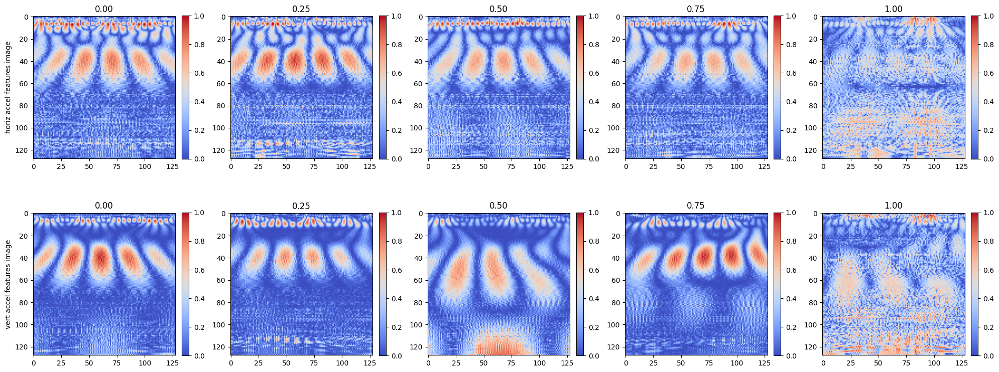

In [ ]:
no_of_samples=5
fig, ax = plt.subplots(2, no_of_samples, figsize=[20,8])
ax[0,0].set_ylabel('horiz accel features image')
ax[1,0].set_ylabel('vert accel features image')

for i, p in enumerate(np.linspace(0,1,no_of_samples)):
    ind = int((no_of_files-1)*p)

    coef = extract_feature_image(ind, feature_name='horiz accel')
    ax[0,i].set_title('{0:.2f}'.format(p))
    im = ax[0,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[0,i], fraction=0.046, pad=0.04)

    coef = extract_feature_image(ind, feature_name='vert accel')
    ax[1,i].set_title('{0:.2f}'.format(p))
    im = ax[1,i].imshow(coef, cmap='coolwarm')
    fig.colorbar(im, ax=ax[1,i], fraction=0.046, pad=0.04)

plt.tight_layout()

plt.show()

In [ ]:
data = {'x': [], 'y': []}
for i in range(0, no_of_files):
    coef_h = extract_feature_image(i, feature_name='horiz accel')
    coef_v = extract_feature_image(i, feature_name='vert accel')
    x_ = np.array([coef_h, coef_v])
    y_ = i/(no_of_files-1)
    data['x'].append(x_)
    data['y'].append(y_)
data['x']=np.array(data['x'])
data['y']=np.array(data['y'])

assert data['x'].shape==(no_of_files, 2, 128, 128)
print(no_of_files, data['x'].shape, data['y'].shape)

1637 (1637, 2, 128, 128) (1637,)


In [ ]:
no_of_val = int(VAL_SPLIT*no_of_files)
perm = np.random.permutation(no_of_files)
val_data = {'x': data['x'][perm[0:no_of_val]], 'y': data['y'][perm[0:no_of_val]]}
train_data = {'x': data['x'][perm[no_of_val: ]], 'y': data['y'][perm[no_of_val: ]]}

print(no_of_val, val_data['x'].shape, val_data['y'].shape)
print(no_of_files-no_of_val, train_data['x'].shape, train_data['y'].shape)

163 (163, 2, 128, 128) (163,)
1474 (1474, 2, 128, 128) (1474,)


In [ ]:
out_file = main_dir + 'bearing3_2_val_data.pkz'
with open(out_file, 'wb') as f:
    pkl.dump(val_data, f)


out_file = main_dir + 'bearing3_2_train_data.pkz'
with open(out_file, 'wb') as f:
    pkl.dump(train_data, f)

3

In [ ]:
import os
import pickle as pkl
import torch
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import numpy as np

In [ ]:
def load_data_from_pfile(file_path):
    with open(file_path, 'rb') as pfile:
        sample_data = pkl.load(pfile)
    return sample_data

In [ ]:
pkzfiles_path = '/content/drive/MyDrive/Colab/phm-ieee-2012-data-challenge-dataset/Learning_set/'

In [ ]:
sample_file = pkzfiles_path + 'bearing1_1_train_data.pkz'
sample_data = load_data_from_pfile(sample_file)
print(sample_data['x'].shape, sample_data['y'].shape)

(2523, 2, 128, 128) (2523,)


In [ ]:
class PHMDataset(Dataset):
    '''
    PHM IEEE 2012 Data Challenge Training data set (6 different Mechanical Bearings data)
    '''
    def __init__(self, pfiles=[]):
        self.data = {'x': [], 'y': []}
        for pfile in pfiles:
            _data = load_data_from_pfile(pfile)
            self.data['x'].append(_data['x'])
            self.data['y'].append(_data['y'])
        self.data['x'] = np.concatenate(self.data['x'])
        self.data['y'] = np.concatenate(self.data['y'])[:,np.newaxis]

    def __len__(self):
        return self.data['x'].shape[0]

    def __getitem__(self, i):
        sample = {'x': torch.from_numpy(self.data['x'][i]), 'y': torch.from_numpy(self.data['y'][i])}
        return sample

In [ ]:
pkzfiles_path = '/content/drive/MyDrive/Colab/phm-ieee-2012-data-challenge-dataset/Learning_set/'
train_pfiles = [pkzfiles_path+'bearing1_1_train_data.pkz', pkzfiles_path+'bearing1_2_train_data.pkz', \
                pkzfiles_path+'bearing2_1_train_data.pkz', pkzfiles_path+'bearing2_2_train_data.pkz', \
                pkzfiles_path+'bearing3_1_train_data.pkz', pkzfiles_path+'bearing3_2_train_data.pkz']

In [ ]:
train_dataset = PHMDataset(pfiles=train_pfiles)
print(len(train_dataset))

6783


In [ ]:

train_dataloader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=0)

In [ ]:
for i, batch in enumerate(train_dataloader):
    print(i, batch['x'].size(), batch['y'].size())
    if i==4:
        break

0 torch.Size([4, 2, 128, 128]) torch.Size([4, 1])
1 torch.Size([4, 2, 128, 128]) torch.Size([4, 1])
2 torch.Size([4, 2, 128, 128]) torch.Size([4, 1])
3 torch.Size([4, 2, 128, 128]) torch.Size([4, 1])
4 torch.Size([4, 2, 128, 128]) torch.Size([4, 1])


4

In [ ]:
import os
import pickle as pkl
import torch
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import numpy as np
import torch.nn as nn
import torch.optim as optim
from matplotlib import pyplot as plt

In [ ]:
def load_data_from_pfile(file_path):
    with open(file_path, 'rb') as pfile:
        sample_data = pkl.load(pfile)
    return sample_data

In [ ]:
class PHMDataset(Dataset):
    '''
    PHM IEEE 2012 Data Challenge Training data set (6 different Mechanical Bearings data)
    '''
    def __init__(self, pfiles=[]):
        self.data = {'x': [], 'y': []}
        for pfile in pfiles:
            _data = load_data_from_pfile(pfile)
            self.data['x'].append(_data['x'])
            self.data['y'].append(_data['y'])
        self.data['x'] = np.concatenate(self.data['x'])
        self.data['y'] = np.concatenate(self.data['y'])[:,np.newaxis]

    def __len__(self):
        return self.data['x'].shape[0]

    def __getitem__(self, i):
        sample = {'x': torch.from_numpy(self.data['x'][i]), 'y': torch.from_numpy(self.data['y'][i])}
        return sample

In [ ]:
pkzfiles_path = '/content/drive/MyDrive/Colab/phm-ieee-2012-data-challenge-dataset/Learning_set/'

train_pfiles = [pkzfiles_path+'bearing1_1_train_data.pkz', pkzfiles_path+'bearing1_2_train_data.pkz', \
                pkzfiles_path+'bearing2_1_train_data.pkz', pkzfiles_path+'bearing2_2_train_data.pkz', \
                pkzfiles_path+'bearing3_1_train_data.pkz', pkzfiles_path+'bearing3_2_train_data.pkz']

val_pfiles = [pkzfiles_path+'bearing1_1_val_data.pkz', pkzfiles_path+'bearing1_2_val_data.pkz', \
              pkzfiles_path+'bearing2_1_val_data.pkz', pkzfiles_path+'bearing2_2_val_data.pkz', \
              pkzfiles_path+'bearing3_1_val_data.pkz', pkzfiles_path+'bearing3_2_val_data.pkz']

In [ ]:
train_dataset = PHMDataset(pfiles=train_pfiles)
val_dataset = PHMDataset(pfiles=val_pfiles)
print(len(train_dataset), len(val_dataset))

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/Colab/phm-ieee-2012-data-challenge-dataset/Learning_set/bearing1_1_train_data.pkz'

In [ ]:
train_batch_size = 64
val_batch_size = 64

In [ ]:

train_dataloader = DataLoader(train_dataset, batch_size=train_batch_size, shuffle=True, num_workers=1)
val_dataloader = DataLoader(val_dataset, batch_size=val_batch_size, shuffle=True, num_workers=1)

In [ ]:
def conv_bn_relu(in_channels, out_channels, kernel_size, stride=1, padding=0, dilation=1, groups=1, bias=True, padding_mode='zeros', batch_norm=True):
    conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride=stride, padding=padding, dilation=dilation, groups=groups, bias=bias, padding_mode=padding_mode)
    nn.init.xavier_uniform_(conv.weight)
    relu = nn.ReLU()
    if batch_norm:
        return nn.Sequential(
            conv,
            nn.BatchNorm2d(out_channels),
            relu
        )
    else:
        return nn.Sequential(
            conv,
            relu
        )

In [ ]:
'''
Python classes and objects => https://www.w3schools.com/python/python_classes.asp
A Class is like an object constructor, or a blueprint for creating objects. and objects of the class is used as references to access (= read, get, obtain,
examine, acquire) the class properties (properties = variables, arrays, lists, etc.)

Python Inheritance => https://www.w3schools.com/python/python_inheritance.asp
Inheritance allows us to define a class that inherits (= acquires, obtains, gets, recieves) all the methods and properties from another class.

Created CNN_FP class using class keyword. send nn.Module class as the parameter inside the CNN_FP class. nn.Module is the Base class(or super class or parent
class) for all neural network modules(= basically, a module is a python file. module is a file consisting of python code. module can define functions, classes
and variables). nn.Module class contains all the methods and properties of neural networks. our models should also subclass this class. (i.e. our model
should inherits (= acquires, obtains, gets, recieves) all the methods and properties from this nn.Module class.). To create a class that inherits the
functionality (=methods and properties) from another class, send the parent class as a parameter when creating the child class. Here, nn.Module is the parent
class and CNN_FP is the child class. Parent class is a class from which a class inherits. Child class is a class which inherits from another class (parent
class), child class also called as derived class or sub class class CNN_FP(nn.Module) => this means CNN_FP class inherits the functionality (= methods and
properties) from nn.Module class

Using def keyword, we defined (= created) __init__ function. __init__ function is used to assign values to class object properties or other operations that are
necessary to do when the object is being created. The __init__() function is called automatically every time the class is being used to create a new object. We
added __init__() function to the child class, therefore the child class will no longer inherit the parent's __init__() function. The child's __init__() function
overrides (= removes, ignores) the inheritance of the parent's __init__() function. The self parameter is a reference to the current (= present, ongoing)
instance (= object) of the class, and is used to access (= read, obtain, examine, acquire) the properties (like variables, arrays, lists, dictionaries, tuples,
strings) that belongs to the class. (reference in python = a python program accesses (= reads, obtains, gets) data values through (= via) references. A
reference is a name that refers to the specific (= certain, particular) location in memory of a value (object))

super().__init__() => this initializes (= starts, activates) the parent class (i.e. nn.Module), basically this activates the nn.Module class and uses nn.Module
class functionality (properties and methods)

conv1 is the property (property in class means variable of a class or array of a class or string of a class or list of a class or dictionary of a class or tuple
of a class) of CNN_FP class and self parameter is the object of CNN_FP class which is used to access conv1. conv_bn_relu() function applies Convolution, Batch
Normalization and ReLU activation function if batch_norm is True else (i.e. batch_norm is False) applies Convolution and ReLU activation function.
conv_bn_relu() function takes in_channels, out_channels, kernel_size, stride, padding, bias=True, batch_norm as parameters (arguments or values) to the function.
here, in_channels=2, out_channels=16, kernel_size=3, stride=1, padding=1, bias=False, batch_norm=True

pool1 is the property of CNN_FP class and self parameter is the object of CNN_FP class which is used to access pool1. nn.MaxPool2d() Applies a 2D max pooling
over an input. (Max pooling is a pooling operation that selects the maximum element (max pixel value) from the region of feature map covered by the filter.)
(pooling means combining pixel values as groups, since we taken 2x2 filter for max pooling, one 2x2 matrix is considered as one group). Basically max pool
returns the maximum pixel value (maximum element) from feature maps (feature images) and outputs a pooled feature map. nn.MaxPool2d() takes kernel_size and
stride as parameters (arguments or values) to the function. here, kernel_size=2, stride=2

conv2, pool2, conv3, pool3, conv4, pool4 => approach is same as conv1 and pool1

flatten is the property of CNN_FP class and self parameter is the object of CNN_FP class which is used to access flatten. nn.Flatten() Flattens(=reduces) a
contiguous(=adjacent, side-by-side, close, next-to) range(area, space) of dimensions into a tensor
(tensor = https://www.javatpoint.com/pytorch-tensors#:~:text=A%20tensor%20is%20an%20n,computation%20with%20strong%20GPU%20acceleration)
(tensor = A tensor is an n-dimensional data container. For example, In PyTorch, 1d-tensor is a vector, 2d-tensor is a matrix, 3d- tensor is a cube, and
4d-tensor is a cube vector.)
(Basically, flatten => flattening is converting the data (image pixel values) into a 1-dimensional array for inputting it to the next layer. Flatten the output
                       of the convolution and max pool layers to create a single long feature vector (or single linear continuous vector). And this vector is
                       connected to the final classification model, which is called a fully-connected layer.
                       In other words, put all the pixel data (pixel values) in one line and make connections with the final layers (fully connected layers).
                       In the above architecture diagram, after flattening, we got a 1D single long feature vector (1D single linear continuous vector) of
                       128x8x8 = 8192 size.

fc1 is the property of CNN_FP class and self parameter is the object of CNN_FP class which is used to access fc1. (fc1 => represents fully connected layer 1).
nn.Linear() Applies a linear transformation to the incoming(=inputting, arriving, entering, comming, approaching) data. (linear transformation = linear
transformation (sometimes called linear map) is a mapping(= matching process where the points(or data points) of one set are matched against the points of
another set ) between 2 vector spaces. linear transformation takes a vector as input and transforms(= change, modify, convert)). nn.linear() function takes
in_features and out_features as parameters. (in_features – size of each input sample, out_features – size of each output sample). here, in_features=8192
(i.e. size of the input (vector) is 8192), out_features=256 (i.e. size of the output(vector) is 256). Therefore after applying Linear function to the flatten
layer output, the size of the flatten layer output is reduced from 8192 to 256. (256 is the size of fc1 layer output)

fc2 is the property of CNN_FP class and self parameter is the object of CNN_FP class which is used to access fc2. (fc2 => represents fully connected layer 2).
nn.Linear() Applies a linear transformation to the incoming data. nn.linear() function takes in_features and out_features as parameters. here, in_features= 256
out_features=128. Therefore after applying Linear function to the fc1, the size of the fc1 output is reduced from 256 to 128.(128 is the size of the fc2 output)

fc3 is the property of CNN_FP class and self parameter is the object of CNN_FP class which is used to access fc3. (fc3 => represents fully connected layer 3).
nn.Linear() Applies a linear transformation to the incoming data. nn.linear() function takes in_features and out_features as parameters. here, in_features= 128
out_features=1. Thereforre after applying Linear function to the fc2, the size of the fc2 output is reduced from 128 to 1. (1 is the size of the fc3 output)

dropout1 is the property of CNN_FP class and self parameter is the object of CNN_FP class which is used to access dropout1. (dropout1 => dropout for fc1).
nn.Dropout() randomly zeroes some of the elements of the input tensor with probability p, during training. Each channel will become zero on every forward call.
(forward call or forward pass = The "forward pass" refers to calculation process, values of the output layers from the inputs data. forward call or forward pass
in CNN means traversing(= traveling, moving) through all neurons from first to last layer. A loss function is calculated from the output values.) (neurons in
artificial neural networks(artificial neural netowrks such as CNN, fully connected neural networks or fully connected layers) =
https://www.tutorialspoint.com/artificial_neural_network/artificial_neural_network_basic_concepts.htm , basically neurons in CNN contains the information
about input signals.). nn.Dropout() function takes p and inplace as parameters. p represents => probability of an element(sample) to be zeroed (probability of
an element to become zero). Default p value: 0.5. here, p=0.5

dropout2 is the property of CNN_FP class and self parameter is the object of CNN_FP class which is used to access dropout2. (dropout2 => dropout for fc2).
nn.Dropout() function takes p and inplace as parameters. p represents => probability of an element(sample) to be zeroed (probability of an element to become
zero). Default p value: 0.5. here, p=0.2

forward() method is a method present in nn.Module class. forward() method applies forward pass or forward call or forward propagation of CNN. (forward call or
forward pass = The "forward pass" refers to calculation process, calculating the values of the output layers from the inputs data. forward call or forward pass
in CNN means traversing(= traveling, moving) through all neurons from first to last layer. A loss function is calculated from the output values.) (neurons in
artificial neural networks(artificial neural netowrks such as CNN, fully connected neural networks or fully connected layers) =
https://www.tutorialspoint.com/artificial_neural_network/artificial_neural_network_basic_concepts.htm , basically neurons in CNN contains the information
about input signals.)
using def keyword defined(= created) forward() method and passed self and x as the paramters inside the function. self => The self parameter is a reference to
the current (= present, ongoing) instance (= object) of the class, and is used to access (= read, obtain, examine, acquire) the properties (like variables,
arrays, lists, dictionaries, tuples, strings, etc.) that belongs to the class. (reference in python = a python program accesses (= reads, obtains, gets) data
values through (= via) references. A reference is a name that refers to the specific (= certain, particular) location in memory of a value (object)). x => x
represents tensor.
forward() method accepts a tensor as input, and then, returns a tensor as output. the returned tensor will be the output of the network. The forward() method
is the actual network transformation. The forward method is the mapping that maps(=matches) an input tensor to a prediction output tensor. (To know more about
forward() method refer this link => https://deeplizard.com/learn/video/MasG7tZj-hw)

'''
class CNN_FP(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = conv_bn_relu(2, 16, 3, stride=1, padding=1, bias=True, batch_norm=True)
        self.pool1 = nn.MaxPool2d(2, stride=2)
        self.conv2 = conv_bn_relu(16, 32, 3, stride=1, padding=1, bias=True, batch_norm=True)
        self.pool2 = nn.MaxPool2d(2, stride=2)
        self.conv3 = conv_bn_relu(32, 64, 3, stride=1, padding=1, bias=True, batch_norm=True)
        self.pool3 = nn.MaxPool2d(2, stride=2)
        self.conv4 = conv_bn_relu(64, 128, 3, stride=1, padding=1, bias=True, batch_norm=True)
        self.pool4 = nn.MaxPool2d(2, stride=2)
        self.flatten = nn.Flatten()
        self.fc1 = nn.Linear(8192, 256)
        self.fc2 = nn.Linear(256, 128)
        self.fc3 = nn.Linear(128, 1)
        self.dropout1 = nn.Dropout(p=0.5)
        self.dropout2 = nn.Dropout(p=0.2)

    '''
    To perform the convolution operation, we pass the tensor to the forward method of the first convolutional layer, self.conv1. when we call the forward()
    method of a nn.Module, there is a special way that we make the call. When want to call the forward() method of a nn.Module instance(object), we call the
    actual instance instead of calling the forward() method directly i.e.
    Instead of doing this => self.conv1.forward(tensor), we do this => self.conv1(tensor). here, x is the tensor
    our input tensor will transform(= change) as we move through the convolution layers. The first convolution layer has a convolution operation, whose
    output is then passed to a max pooling operation with kernel_size=2 and stride=2 (our input image 1st goes into convolution layer, in this layer convolution
    operation will be performed on the input image)

    The output tensor x of the first convolution layer is then passed to the next convolution layer after applying max pool to the output tensor x, which is
    identical except for the fact that we call self.conv2() instead of self.conv1(). same procedure for conv3 and conv4 as well. (self.conv3(), self.conv4())

    after applying convolution and max pooling to the tensor x, we flatten (= reduce, reshape) the tensor x (basically we converting n dimensional array into
    single linear continuous vector) to feed this flattened vector into fully connected layers

    fc1 => represents fully connected layer 1. here, fc1 applies linear transformation (i.e. nn.Linear()) to the tensor x. linear transformation takes a vector
    as input and transforms(= change, modify, convert))that vector. nn.Linear() function takes in_features and out_features as parameters. (in_features – size
    of each input sample, out_features – size of each output sample). here, in_features=8192 (i.e. size of the input (vector) is 8192), out_features=256 (i.e.
    size of the output(vector) is 256). Therefore after applying fc1 layer to the flatten layer output, the size of the flatten layer output is reduced from
    8192 to 256. (256 is the size of fc1 layer output)

    dropout1 => dropout for fc1. nn.Dropout() randomly zeroes some of the elements of the input tensor x with probability p, during training. Each channel will
    become zero on every forward call. nn.Dropout() function takes p and inplace as parameters. p represents => probability of an element(sample) to be zeroed
    (probability of an element to become zero). Default p value: 0.5. here, p=0.5

    nn.ReLU() => Applies the Rectified Linear Units function element-wise, ReLU(x) = (x)+ = max(0,x). (ReLU => Rectified Linear Units layer, ReLU is an
    activation function that will output the positive values or non-negative values (> 0) as it is without change, whereas output the negative values (< 0) as
    zero (0). Advantage of ReLU: ReLU allows the models to learn faster and perform better, avoids overfitting.). After applying dropout1 to the tensor x,
    applies ReLU activation function (i.e. nn.ReLU()) to the tensor x )

    fc2 => represents fully connected layer 2. here, fc2 applies linear transformation (i.e. nn.Linear()) to the tensor x. linear transformation takes a vector
    as input and transforms(= change, modify, convert))that vector. nn.Linear() function takes in_features and out_features as parameters. (in_features – size
    of each input sample, out_features – size of each output sample). here, in_features=256 (i.e. size of the input (vector) is 256), out_features=128 (i.e.
    size of the output(vector) is 128). Therefore after applying fc2 layer to the fc1 layer output, the size of the fc1 layer output is reduced from 256 to
    128. (128 is the size of fc2 layer output)

    dropout2 => dropout for fc2. nn.Dropout() randomly zeroes some of the elements of the input tensor x with probability p, during training. Each channel will
    become zero on every forward call. nn.Dropout() function takes p and inplace as parameters. p represents => probability of an element(sample) to be zeroed
    (probability of an element to become zero). Default p value: 0.5. here, p=0.2
    (in dropout1, p value=0.5......in dropout2, p value=0.2)

    After applying dropout2 to the tensor x, applies ReLU activation function (i.e. nn.ReLU()) to the tensor x)

    fc3 => represents fully connected layer 3. here, fc3 applies linear transformation (i.e. nn.Linear()) to the tensor x. linear transformation takes a vector
    as input and transforms(= change, modify, convert))that vector. nn.Linear() function takes in_features and out_features as parameters. (in_features – size
    of each input sample, out_features – size of each output sample). here, in_features=128 (i.e. size of the input (vector) is 128), out_features=1 (i.e. size
    of the output(vector) is 1). Therefore after applying fc3 layer to the fc2 layer output, the size of the fc2 layer output is reduced from 128 to 1. (1 is
    the size of fc3 layer output)

    return keyword => return keyword returns the output of a function and exits the function
    return x => returns the tensor x of forward() and exits the forward() function

    '''
    def forward(self, x):
        # input shape = [Nx2x128x128]
        x = self.conv1(x) # [Nx16x128x128]
        x = self.pool1(x) # [Nx16x64x64]
        x = self.conv2(x) # [Nx32x64x64]
        x = self.pool2(x) # [Nx32x32x32]
        x = self.conv3(x) # [Nx64x32x32]
        x = self.pool3(x) # [Nx64x16x16]
        x = self.conv4(x) # [Nx128x16x16]
        x = self.pool4(x) # [Nx128x8x8]
        x = self.flatten(x) # [Nx8192] {128*8*8=8192} (N => batch size, 128 => no. of channels, 8*8 => height of image*width of image)
        x = self.fc1(x) # [Nx256]
        # x = self.dropout1(x) # apply dropout
        x = nn.ReLU()(x) # apply ReLU activation
        x = self.fc2(x) # [Nx128]
        # x = self.dropout2(x) # apply dropout
        x = nn.ReLU()(x) # apply ReLU activation
        x = self.fc3(x) # final fully connected layer (or) final linear layer [Nx1] -> output is probability of fault
        return x

In [ ]:
def forward(self, x):
        # input shape = [Nx2x128x128]
        x = self.conv1(x) # [Nx16x128x128]
        x = self.pool1(x) # [Nx16x64x64]
        x = self.conv2(x) # [Nx32x64x64]
        x = self.pool2(x) # [Nx32x32x32]
        x = self.conv3(x) # [Nx64x32x32]
        x = self.pool3(x) # [Nx64x16x16]
        x = self.conv4(x) # [Nx128x16x16]
        x = self.pool4(x) # [Nx128x8x8]
        x = self.flatten(x) # [Nx8192] {128*8*8=8192} (N => batch size, 128 => no. of channels, 8*8 => height of image*width of image)
        x = self.fc1(x) # [Nx256]
        # x = self.dropout1(x) # apply dropout
        x = nn.ReLU()(x) # apply ReLU activation
        x = self.fc2(x) # [Nx128]
        # x = self.dropout2(x) # apply dropout
        x = nn.ReLU()(x) # apply ReLU activation
        x = self.fc3(x) # final fully connected layer (or) final linear layer [Nx1] -> output is probability of fault
        return x

In [ ]:
device=torch.device("cuda:0" if torch.cuda.is_available() else "cpu") # Declaring a variable "device" which will hold the device(i.e. either GPU or CPU) we are
                                                                      #training the model on
print(device)
device

cpu


device(type='cpu')

In [ ]:
model = CNN_FP().to(device)

In [ ]:
criterion = nn.MSELoss(reduction='sum')

In [ ]:

optimizer = optim.Adam(model.parameters(), lr=0.001, betas=(0.9, 0.999), eps=1e-08, weight_decay=0.01, amsgrad=False)

In [ ]:

multistep_lr_sch = optim.lr_scheduler.MultiStepLR(optimizer, milestones=[10,20], gamma=0.1, last_epoch=-1, verbose=False)

NameError: name 'optim' is not defined

In [ ]:

def train_epoch(model, dataloader, criterion, optimizer):
    total_loss = 0
    num_of_samples = 0
    model.train()
    for i, batch in enumerate(dataloader):
        x = batch['x'].to(device, dtype=torch.float)
        y = batch['y'].to(device, dtype=torch.float)

        optimizer.zero_grad()
        y_prediction = model(x)
        loss = criterion(y_prediction, y)
        loss.backward()
        optimizer.step()

        total_loss += loss.cpu().item()
        num_of_samples += x.shape[0]
    return total_loss/num_of_samples

In [ ]:
def eval(model, dataloader, criterion):
    total_loss = 0
    num_of_samples = 0
    model.eval()
    for i, batch in enumerate(dataloader):
        x = batch['x'].to(device, dtype=torch.float)
        y = batch['y'].to(device, dtype=torch.float)

        with torch.no_grad():
            y_prediction = model(x)
            loss = criterion(y_prediction, y)

        total_loss += loss.cpu().item()
        num_of_samples += x.shape[0]
    return total_loss/num_of_samples

In [ ]:
max_epochs = 30

loss_vals = []
for epoch in range(max_epochs):
    train_loss = train_epoch(model, train_dataloader, criterion, optimizer)
    val_loss = eval(model, val_dataloader, criterion)
    multistep_lr_sch.step()
    loss_vals.append([train_loss, val_loss])
    print('{0}/{1}: train_loss = {2:.4f}, val_loss = {3:.4f}'.format(epoch+1, max_epochs, train_loss, val_loss) )

NameError: name 'train_epoch' is not defined